In [2]:
import numpy as np

# Librerias para graficación (trazado de gráficos)
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D  # Necesario para graficar superficies 3D
import pandas as pd

# llama a matplotlib a embeber graficas dentro de los cuadernillos
%matplotlib inline

In [3]:

#archivo excel leido con pandas
data = pd.read_csv("housing.csv", sep=",")
print(data)
#leer tipos de datos
data.dtypes

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0        -122.23     37.88                41.0        880.0           129.0   
1        -122.22     37.86                21.0       7099.0          1106.0   
2        -122.24     37.85                52.0       1467.0           190.0   
3        -122.25     37.85                52.0       1274.0           235.0   
4        -122.25     37.85                52.0       1627.0           280.0   
...          ...       ...                 ...          ...             ...   
20635    -121.09     39.48                25.0       1665.0           374.0   
20636    -121.21     39.49                18.0        697.0           150.0   
20637    -121.22     39.43                17.0       2254.0           485.0   
20638    -121.32     39.43                18.0       1860.0           409.0   
20639    -121.24     39.37                16.0       2785.0           616.0   

       population  households  median_income  media

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [4]:
X, y = data.iloc[:, 5].values , data.iloc[:, 6].values
m = y.size
x_original = X
y_original = y
X_mean = np.mean(x_original)
X_std  = np.std(x_original)

y_mean = np.mean(y_original)
y_std  = np.std(y_original)

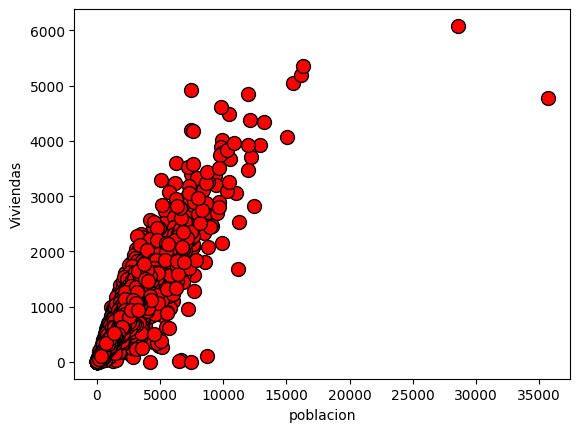

In [5]:
def plotData(x, y):
    #Grafica los puntos x e y en una figura nueva.

    fig = pyplot.figure()  # abre una nueva figura

    pyplot.plot(x, y, 'ro', ms=10, mec='k')
    pyplot.ylabel('Viviendas')
    pyplot.xlabel('poblacion')

plotData(X, y)


In [6]:
X = (X - np.mean(X)) / np.std(X)
y = (y - np.mean(y)) / np.std(y)
print(X)
print(y)

[-0.9744286   0.86143887 -0.82077735 ... -0.3695372  -0.60442933
 -0.03397701]
[-0.97703285  1.66996103 -0.84363692 ... -0.17404163 -0.39375258
  0.07967221]


In [7]:
X = np.stack([np.ones(m), X], axis=1)

In [8]:
#Calclulo del coste
def calcularCosto(X, y, theta):
    # inicializa algunos valores importantes
    m = y.size  # numero de ejemplos de entrenamiento

    J = 0
    # h = np.dot(X, theta)
    J = (1/(2 * m)) * np.sum(np.square(np.dot(X, theta) - y))
    return J

In [9]:
#Calculo del gradiente
def gradientDescent(X, y, theta, alpha, num_iters):
        # Inicializa algunos valores importantes
    m = y.shape[0]  # numero de ejemplos de entrenamiento

    # hace una copia de theta, para evitar cambiar la matriz original,
    # ya que las matrices numpy se pasan por referencia a las funciones

    theta = theta.copy()

    J_history = [] # Lista que se utiliza para almacenar el costo en cada iteración

    for i in range(num_iters):
        theta = theta - (alpha / m) * (np.dot(X, theta) - y).dot(X)
        # save the cost J in every iteration
        J_history.append(calcularCosto(X, y, theta))

    return theta, J_history

In [10]:
# inicializa los parametros de ajuste
theta = np.zeros(2)

# configuraciones para el descenso por el gradiente
iterations = 500000
alpha = 0.0001

theta, J_history = gradientDescent(X ,y, theta, alpha, iterations)
print('Theta encontrada por descenso gradiente: {:.4f}, {:.4f}'.format(*theta))
print('Valores theta esperados (aproximadamente): [-3.6303, 1.1664]')
print(J_history)

Theta encontrada por descenso gradiente: 0.0000, 0.9072
Valores theta esperados (aproximadamente): [-3.6303, 1.1664]
[np.float64(0.4999176988912511), np.float64(0.49983541424190103), np.float64(0.499753146048658), np.float64(0.4996708943082309), np.float64(0.4995886590173294), np.float64(0.4995064401726636), np.float64(0.4994242377709447), np.float64(0.499342051808884), np.float64(0.49925988228319385), np.float64(0.4991777291905874), np.float64(0.4990955925277777), np.float64(0.4990134722914792), np.float64(0.49893136847840686), np.float64(0.49884928108527593), np.float64(0.49876721010880287), np.float64(0.49868515554570436), np.float64(0.4986031173926979), np.float64(0.49852109564650177), np.float64(0.4984390903038346), np.float64(0.4983571013614159), np.float64(0.4982751288159659), np.float64(0.4981931726642051), np.float64(0.4981112329028552), np.float64(0.4980293095286381), np.float64(0.49794740253827663), np.float64(0.4978655119284942), np.float64(0.4977836376960148), np.float64(0

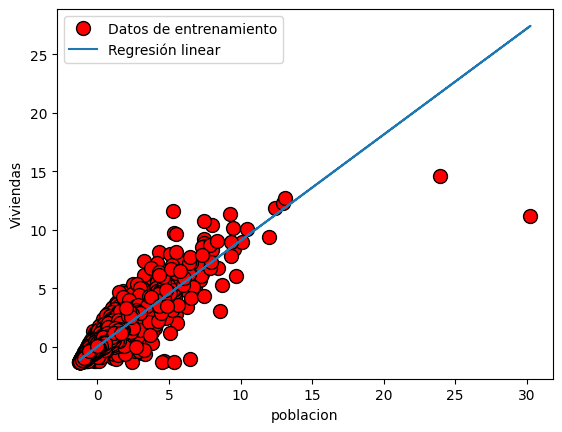

In [11]:
# grafica la linea de ajuste
plotData(X[:, 1], y)
pyplot.plot(X[:, 1], np.dot(X, theta), '-')
pyplot.legend(['Datos de entrenamiento', 'Regresión linear'])

In [ ]:
# FUNCIÓN DE PREDICCIÓN
def hacer_prediccion(poblacion_input, theta, X_mean, X_std, y_mean, y_std):
    # Paso 1: Normalizar la entrada
    poblacion_normalizada = (poblacion_input - X_mean) / X_std
    # Paso 2: Crear vector de entrada [1, x_normalizado]
    entrada = np.array([1, poblacion_normalizada])
    # Paso 3: Hacer predicción con datos normalizados
    prediccion_normalizada = np.dot(entrada, theta)
    # Paso 4: Desnormalizar la predicción
    prediccion_real = prediccion_normalizada * y_std + y_mean
    return prediccion_real

# Ejemplo 1: Para tu valor de 466
poblacion_new = 466
prediccion = hacer_prediccion(poblacion_new, theta, X_mean, X_std, y_mean, y_std)
print(f"Para una población de {poblacion_new}, se predice {prediccion:.2f} viviendas")


Para una población de 466, se predice 205.66 viviendas
